<a href="https://colab.research.google.com/github/shahd1995913/models_world_of_plants_2022/blob/main/st.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
# ----------------------------
# Fast Plant Disease Classification from Google Drive
# ----------------------------

# 1. تركيب Google Drive (Colab)
from google.colab import drive
drive.mount('/content/drive')

# ----------------------------
# 2. استيراد المكتبات
# ----------------------------
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing import image_dataset_from_directory
import shutil, os, time
import numpy as np
from tensorflow.keras.preprocessing import image

start_time = time.time()

# ----------------------------
# 3. نسخ البيانات من Google Drive إلى مجلد محلي لتسريع القراءة
# ----------------------------
drive_dir = '/content/drive/MyDrive/newdata'  # مجلد الأمراض في Drive
local_dir = '/content/newdata_local'

if os.path.exists(local_dir):
    shutil.rmtree(local_dir)
shutil.copytree(drive_dir, local_dir)

# ----------------------------
# 4. إعداد بيانات التدريب والتحقق
# ----------------------------
img_size = (128, 128)  # لتسريع التدريب
batch_size = 32
validation_split = 0.2
seed = 123

train_ds = image_dataset_from_directory(
    local_dir,
    validation_split=validation_split,
    subset="training",
    seed=seed,
    image_size=img_size,
    batch_size=batch_size
)

val_ds = image_dataset_from_directory(
    local_dir,
    validation_split=validation_split,
    subset="validation",
    seed=seed,
    image_size=img_size,
    batch_size=batch_size
)

# تحسين الأداء
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.map(lambda x, y: (preprocess_input(x), y)).cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.map(lambda x, y: (preprocess_input(x), y)).cache().prefetch(buffer_size=AUTOTUNE)

# ----------------------------
# 5. بناء نموذج MobileNetV2
# ----------------------------
base_model = MobileNetV2(input_shape=(128,128,3),
                         include_top=False,
                         weights='imagenet')
base_model.trainable = False  # تجميد الطبقات الأساسية

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dense(train_ds.cardinality().numpy(), activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# ----------------------------
# 6. تدريب النموذج
# ----------------------------
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=3  # سريع للتجربة، يمكن زيادة العدد لاحقاً
)

# ----------------------------
# 7. تجربة تصنيف صورة جديدة
# ----------------------------
img_path = '/content/drive/MyDrive/newdata/Angular_LeafSpot/angular_leafspot.jpg'  # ضع مسار صورتك هنا
img = image.load_img(img_path, target_size=img_size)
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

pred = model.predict(x)
class_idx = np.argmax(pred)
class_names = train_ds.class_names
print(f"Predicted class: {class_names[class_idx]}")
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 4427 files belonging to 11 classes.
Using 3542 files for training.
Found 4427 files belonging to 11 classes.
Using 885 files for validation.
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/3
111/111 ━━━━━━━━━━━━━━━━━━━━ 187s 2s/step - accuracy: 0.6993 - loss: 1.2064 - val_accuracy: 0.9153 - val_loss: 0.2258
Epoch 2/3
111/111 ━━━━━━━━━━━━━━━━━━━━ 81s 535ms/step - accuracy: 0.9483 - loss: 0.1426 - val_accuracy: 0.9311 - val_loss: 0.1892
Epoch 3/3
111/111 ━━━━━━━━━━━━━━━━━━━━ 59s 535ms/step - accuracy: 0.9692 - loss: 0.0869 - val_accuracy: 0.9333 - val_loss: 0.1910
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


AttributeError: '_PrefetchDataset' object has no attribute 'class_names'

In [5]:
# إنشاء train_ds و val_ds بدون أي map أولاً
train_ds = image_dataset_from_directory(
    local_dir,
    validation_split=validation_split,
    subset="training",
    seed=seed,
    image_size=img_size,
    batch_size=batch_size
)

val_ds = image_dataset_from_directory(
    local_dir,
    validation_split=validation_split,
    subset="validation",
    seed=seed,
    image_size=img_size,
    batch_size=batch_size
)

# احفظ أسماء الفئات الآن
class_names = train_ds.class_names
print("Class names:", class_names)

# بعد ذلك قم بتحسين الأداء
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.map(lambda x, y: (preprocess_input(x), y)).cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.map(lambda x, y: (preprocess_input(x), y)).cache().prefetch(buffer_size=AUTOTUNE)


Found 4427 files belonging to 11 classes.
Using 3542 files for training.
Found 4427 files belonging to 11 classes.
Using 885 files for validation.
Class names: ['Angular_LeafSpot', 'Calciumdeficiency', 'Gray_Mold', 'Leaf_Spot', 'Strawberry___Leaf_scorch', 'powdery_mildew_fruit', 'powdery_mildew_leaf', 'sl_trainBeans_Rust', 'sl_trainStrawberry_Blossom_Blight', 'sl_trainStrawberry_Powdery_Mildew_Fruit', 'sl_trainStrawberry_Powdery_Mildew_Leaf']


In [6]:
# ----------------------------
# تجربة تصنيف صورة جديدة
# ----------------------------
img_path = '/content/drive/MyDrive/newdata/Angular_LeafSpot/angular_leafspot.jpg'  # ضع مسار صورتك هنا
img = image.load_img(img_path, target_size=img_size)
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

pred = model.predict(x)
class_idx = np.argmax(pred)
print(f"Predicted class: {class_names[class_idx]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Predicted class: Angular_LeafSpot


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━

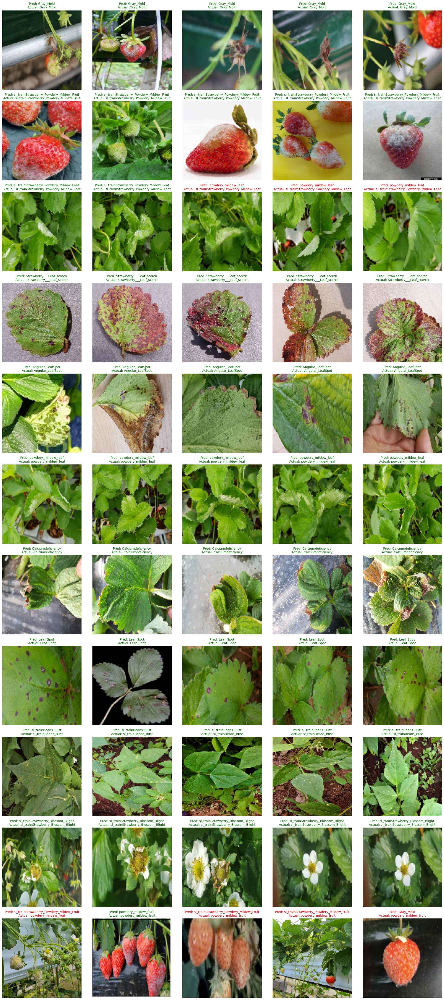

Total images tested: 55
Correct predictions: 48
Accuracy: 87.27%


In [7]:
import random
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing import image
import numpy as np

# ----------------------------
# إعداد العينة
# ----------------------------
sample_size = 5  # عدد الصور لكل فئة
images = []
true_labels = []
pred_labels = []

for class_folder in os.listdir(local_dir):
    folder_path = os.path.join(local_dir, class_folder)
    if os.path.isdir(folder_path):
        img_files = os.listdir(folder_path)
        sampled_files = random.sample(img_files, min(sample_size, len(img_files)))
        for img_file in sampled_files:
            img_path = os.path.join(folder_path, img_file)
            try:
                img_obj = image.load_img(img_path, target_size=img_size)
                x = image.img_to_array(img_obj)
                x = np.expand_dims(x, axis=0)
                x = preprocess_input(x)

                pred = model.predict(x)
                class_idx = np.argmax(pred)
                predicted_class = class_names[class_idx]

                # تخزين النتائج
                images.append(img_obj)
                true_labels.append(class_folder)
                pred_labels.append(predicted_class)

            except Exception as e:
                print(f"Error processing {img_file}: {e}")

# ----------------------------
# عرض النتائج في شبكة
# ----------------------------
num_images = len(images)
cols = 5
rows = (num_images + cols - 1) // cols  # حساب عدد الصفوف

plt.figure(figsize=(20, 4*rows))
for i in range(num_images):
    plt.subplot(rows, cols, i+1)
    plt.imshow(images[i])
    color = 'green' if true_labels[i] == pred_labels[i] else 'red'
    plt.title(f"Pred: {pred_labels[i]}\nActual: {true_labels[i]}", color=color, fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

# ----------------------------
# حساب الدقة
# ----------------------------
correct_predictions = sum([1 for t, p in zip(true_labels, pred_labels) if t==p])
accuracy = correct_predictions / num_images
print(f"Total images tested: {num_images}")
print(f"Correct predictions: {correct_predictions}")
print(f"Accuracy: {accuracy*100:.2f}%")


In [1]:
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing import image
import numpy as np
import random

# ----------------------------
# إعداد العينة: صورة واحدة لكل فئة
# ----------------------------
images = []
true_labels = []
pred_labels = []

for class_folder in os.listdir(local_dir):
    folder_path = os.path.join(local_dir, class_folder)
    if os.path.isdir(folder_path):
        img_files = os.listdir(folder_path)
        if len(img_files) == 0:
            continue
        img_file = random.choice(img_files)  # اختيار صورة واحدة عشوائياً
        img_path = os.path.join(folder_path, img_file)
        try:
            img_obj = image.load_img(img_path, target_size=img_size)
            x = image.img_to_array(img_obj)
            x = np.expand_dims(x, axis=0)
            x = preprocess_input(x)

            pred = model.predict(x)
            class_idx = np.argmax(pred)
            predicted_class = class_names[class_idx]

            # تخزين النتائج
            images.append(img_obj)
            true_labels.append(class_folder)
            pred_labels.append(predicted_class)

        except Exception as e:
            print(f"Error processing {img_file}: {e}")

# ----------------------------
# عرض الصور في شبكة
# ----------------------------
num_images = len(images)
cols = 5
rows = (num_images + cols - 1) // cols

plt.figure(figsize=(20, 4*rows))
for i in range(num_images):
    plt.subplot(rows, cols, i+1)
    plt.imshow(images[i])
    color = 'green' if true_labels[i] == pred_labels[i] else 'red'
    plt.title(f"Pred: {pred_labels[i]}\nActual: {true_labels[i]}", color=color, fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

# ----------------------------
# حساب الدقة
# ----------------------------
correct_predictions = sum([1 for t, p in zip(true_labels, pred_labels) if t==p])
accuracy = correct_predictions / num_images
print(f"Total images tested: {num_images}")
print(f"Correct predictions: {correct_predictions}")
print(f"Accuracy: {accuracy*100:.2f}%")


NameError: name 'local_dir' is not defined